# **PROGRES PROYEK PENGOLAHAN CITRA DIGITAL**

##**KLASIFIKASI DAUN ANGGUR MENGGUNAKAN METODE LBP, GLCM, DAN SVM**

-----


**Nama Anggota Kelompok 8 :**

- Nurus Shobah Hidayati (23031554163)

- Ananda Sakinah (23031554060)

- Permata Witjaksana P. (23031554098)


Dataset : [Grapevine Leaves Image Dataset](https://www.kaggle.com/datasets/muratkokludataset/grapevine-leaves-image-dataset)

## **A. Exploratory Data Analysis (EDA)**


### a. Load Dataset

In [ ]:
from google.colab import files
files.upload()

import os
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

!kaggle datasets download -d muratkokludataset/grapevine-leaves-image-dataset

!unzip -q grapevine-leaves-image-dataset.zip -d grapevine_dataset

Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/muratkokludataset/grapevine-leaves-image-dataset
License(s): CC0-1.0
  0% 0.00/109M [00:00<?, ?B/s]
100% 109M/109M [00:00<00:00, 1.25GB/s]


### b. Distribusi Kelas

Distribusi Kelas:
Ak: 100 gambar
Ala_Idris: 100 gambar
Buzgulu: 100 gambar
Dimnit: 100 gambar
Nazli: 100 gambar


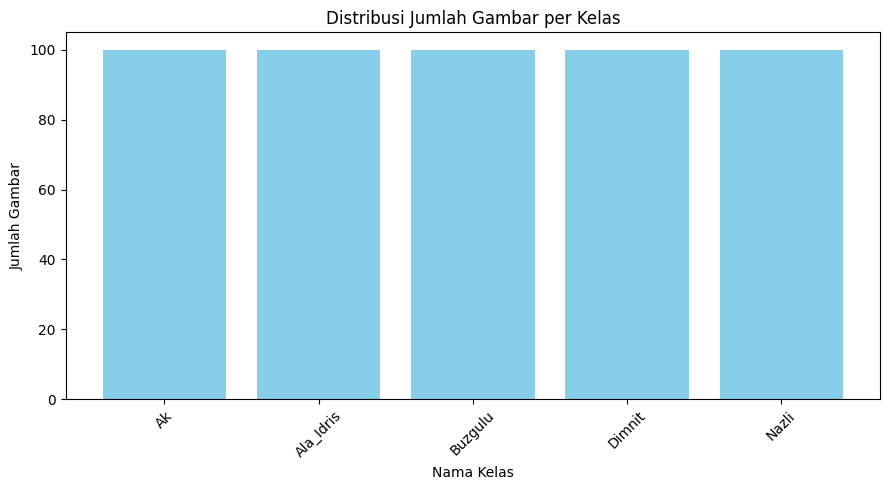

In [ ]:
import os
import matplotlib.pyplot as plt

dataset = "/content/grapevine_dataset/Grapevine_Leaves_Image_Dataset"

class_folders = sorted(os.listdir(dataset))
class_folders = [folder for folder in class_folders if os.path.isdir(os.path.join(dataset, folder))]

class_distribution = {}
for label in class_folders:
    class_path = os.path.join(dataset, label)
    image_count = len([img for img in os.listdir(class_path) if img.endswith(('.jpg', '.png', '.jpeg'))])
    class_distribution[label] = image_count

print("Distribusi Kelas:")
for label, count in class_distribution.items():
    print(f"{label}: {count} gambar")

plt.figure(figsize=(9, 5))
plt.bar(class_distribution.keys(), class_distribution.values(), color='skyblue')
plt.title("Distribusi Jumlah Gambar per Kelas")
plt.xlabel("Nama Kelas")
plt.ylabel("Jumlah Gambar")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### c. Visualisasi Sampel Gambar

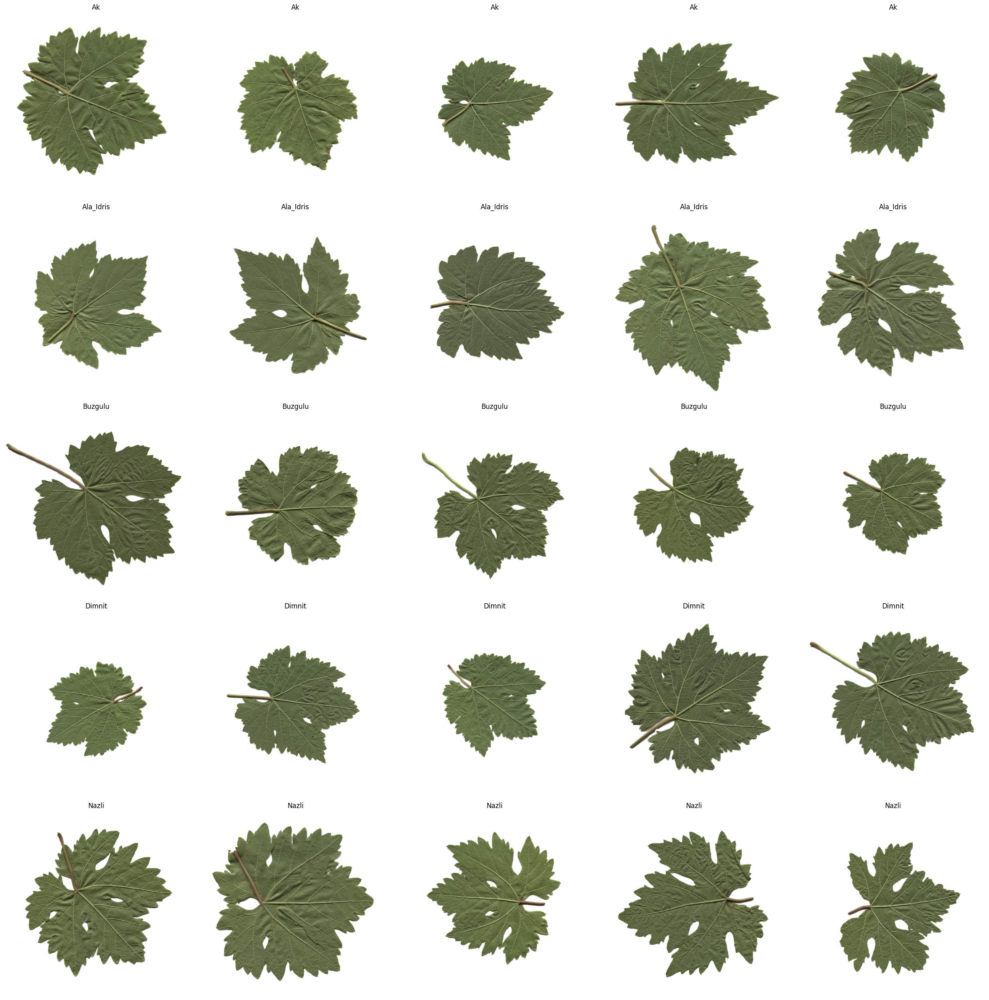

In [ ]:
import cv2

n_images = 5
plt.figure(figsize=(n_images * 5, len(class_folders) * 5))

i = 1
for label in class_folders:
    class_path = os.path.join(dataset, label)
    images = [img for img in os.listdir(class_path) if img.endswith(('.jpg', '.png', '.jpeg'))][:n_images]

    for img_name in images:
        img_path = os.path.join(class_path, img_name)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        plt.subplot(len(class_folders), n_images, i)
        plt.imshow(img)
        plt.title(label)
        plt.axis('off')
        i += 1

plt.tight_layout()
plt.show()

### d. Cek Ukuran Gambar

Statistik Ukuran Gambar:
- Jumlah gambar: 500
- Lebar: min=511, max=511, mean=511.00, median=511.0
- Tinggi: min=511, max=511, mean=511.00, median=511.0
- Aspek Rasio: min=1.0, max=1.0, mean=1.00, median=1.0


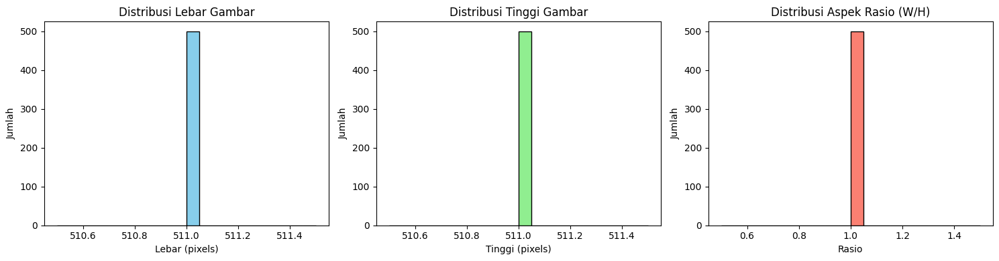

In [ ]:
import numpy as np

widths = []
heights = []
aspect_ratios = []

for label in class_folders:
    class_path = os.path.join(dataset, label)
    for img_name in os.listdir(class_path):
        if img_name.lower().endswith(('.jpg', '.jpeg', '.png')):
            img_path = os.path.join(class_path, img_name)
            img = cv2.imread(img_path)
            if img is not None:
                h, w = img.shape[:2]
                widths.append(w)
                heights.append(h)
                aspect_ratios.append(round(w / h, 2))

print("Statistik Ukuran Gambar:")
print(f"- Jumlah gambar: {len(widths)}")
print(f"- Lebar: min={np.min(widths)}, max={np.max(widths)}, mean={np.mean(widths):.2f}, median={np.median(widths)}")
print(f"- Tinggi: min={np.min(heights)}, max={np.max(heights)}, mean={np.mean(heights):.2f}, median={np.median(heights)}")
print(f"- Aspek Rasio: min={np.min(aspect_ratios)}, max={np.max(aspect_ratios)}, mean={np.mean(aspect_ratios):.2f}, median={np.median(aspect_ratios)}")

plt.figure(figsize=(15, 4))

plt.subplot(1, 3, 1)
plt.hist(widths, bins=20, color='skyblue', edgecolor='black')
plt.title("Distribusi Lebar Gambar")
plt.xlabel("Lebar (pixels)")
plt.ylabel("Jumlah")

plt.subplot(1, 3, 2)
plt.hist(heights, bins=20, color='lightgreen', edgecolor='black')
plt.title("Distribusi Tinggi Gambar")
plt.xlabel("Tinggi (pixels)")
plt.ylabel("Jumlah")

plt.subplot(1, 3, 3)
plt.hist(aspect_ratios, bins=20, color='salmon', edgecolor='black')
plt.title("Distribusi Aspek Rasio (W/H)")
plt.xlabel("Rasio")
plt.ylabel("Jumlah")

plt.tight_layout()
plt.show()

### e. Cek Duplikat Gambar

In [ ]:
from collections import defaultdict
import hashlib

hash_dict = defaultdict(list)

for class_folder in os.listdir(dataset):
    class_path = os.path.join(dataset, class_folder)
    if not os.path.isdir(class_path):
        continue

    for img_name in os.listdir(class_path):
        if img_name.lower().endswith(('.jpg', '.jpeg', '.png')):
            img_path = os.path.join(class_path, img_name)
            try:
                with open(img_path, 'rb') as f:
                    file_hash = hashlib.md5(f.read()).hexdigest()
                hash_dict[file_hash].append(img_path)
            except Exception as e:
                print(f"Error reading {img_path}: {e}")

duplicates = {h: paths for h, paths in hash_dict.items() if len(paths) > 1}

if duplicates:
    print(f"Jumlah grup gambar duplikat ditemukan: {len(duplicates)}\n")
    for i, (h, paths) in enumerate(duplicates.items(), 1):
        print(f"Grup Duplikat #{i}:")
        for p in paths:
            print(f"  - {p}")
        print()
else:
    print("Tidak ditemukan gambar duplikat di dataset.")

Tidak ditemukan gambar duplikat di dataset.


### d. Cek Kualitas Gambar (Blur & Noise)

In [ ]:
threshold_blur = 100.0
threshold_noise = 10.0

blur_image = None
noisy_image = None

for class_name in os.listdir(dataset):
    class_path = os.path.join(dataset, class_name)
    if not os.path.isdir(class_path):
        continue

    for image_name in os.listdir(class_path):
        image_path = os.path.join(class_path, image_name)
        try:
            img = cv2.imread(image_path)
            if img is None:
                continue

            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

            # Deteksi blur
            laplacian_var = cv2.Laplacian(gray, cv2.CV_64F).var()
            if laplacian_var < threshold_blur and blur_image is None:
                blur_image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                blur_title = f"{class_name}/{image_name}"

            # Deteksi noise
            denoised = cv2.fastNlMeansDenoising(gray, None, h=10, templateWindowSize=7, searchWindowSize=21)
            noise_level = np.mean(cv2.absdiff(gray, denoised))
            if noise_level > threshold_noise and noisy_image is None:
                noisy_image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                noisy_title = f"{class_name}/{image_name}"

            if blur_image is not None and noisy_image is not None:
                break
        except:
            continue
    if blur_image is not None and noisy_image is not None:
        break

if blur_image is not None:
    plt.figure(figsize=(5,5))
    plt.imshow(blur_image)
    plt.title(f"Contoh Gambar Blur: {blur_title}")
    plt.axis('off')
    plt.show()
else:
    print("Tidak ditemukan gambar blur.")

if noisy_image is not None:
    plt.figure(figsize=(5,5))
    plt.imshow(noisy_image)
    plt.title(f"Contoh Gambar Noisy: {noisy_title}")
    plt.axis('off')
    plt.show()
else:
    print("Tidak ditemukan gambar noisy.")


Tidak ditemukan gambar blur.
Tidak ditemukan gambar noisy.


## **Preprocessing**

### a. Resize Image

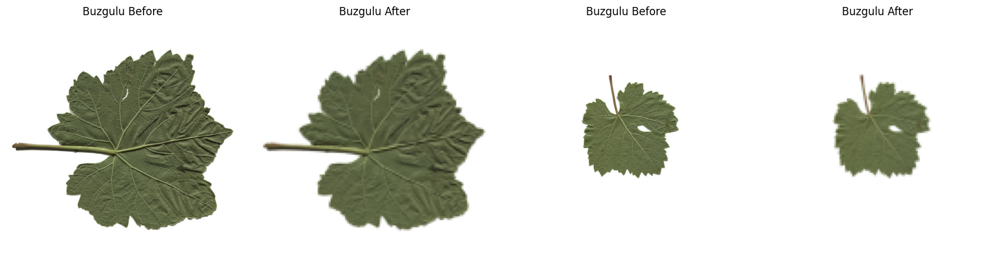

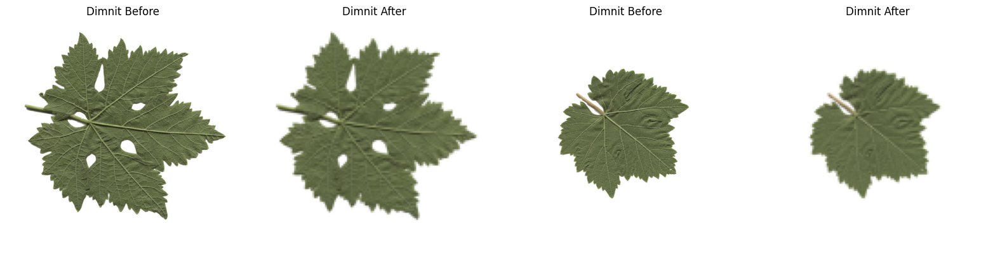

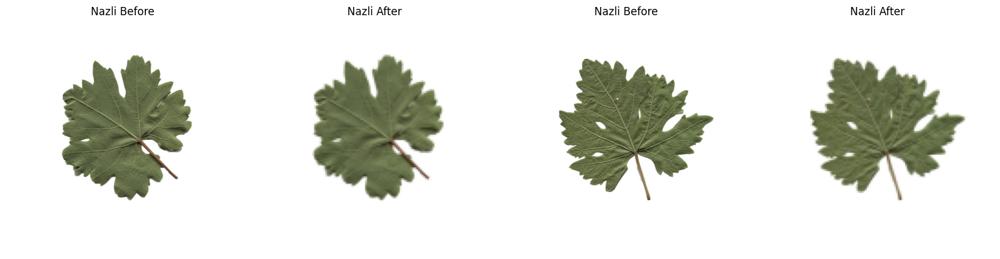

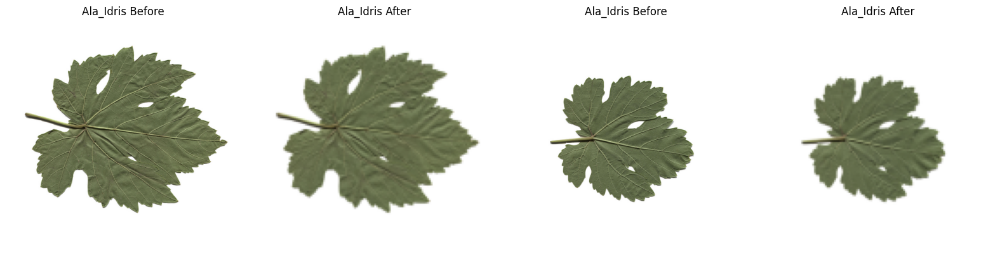

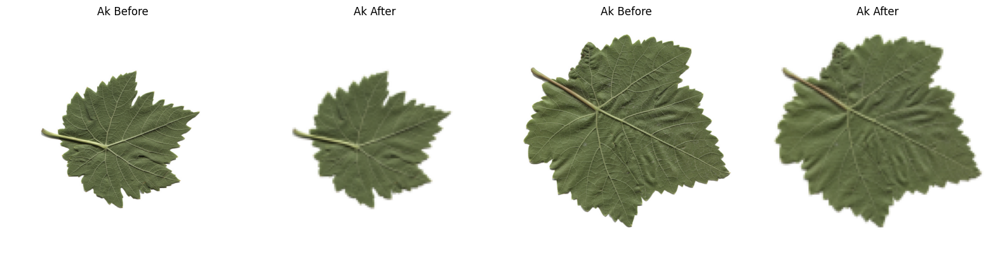

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt

dataset_dir = dataset
target_size = (128, 128)

resized = {}

for class_name in os.listdir(dataset_dir):
    class_path = os.path.join(dataset_dir, class_name)
    if not os.path.isdir(class_path):
        continue

    images = []
    image_names = os.listdir(class_path)

    for image_name in image_names:
        image_path = os.path.join(class_path, image_name)
        img = cv2.imread(image_path)
        if img is None:
            print(f"Warning: Tidak dapat membaca gambar di {image_path}")
            continue

        resized_img = cv2.resize(img, target_size, interpolation=cv2.INTER_AREA)
        images.append((img, resized_img))

    resized[class_name] = images

for class_name, image_pairs in resized.items():
    plt.figure(figsize=(16, 4))

    for i, (before, after) in enumerate(image_pairs[:2]):
        plt.subplot(1, 4, 2*i + 1)
        plt.imshow(cv2.cvtColor(before, cv2.COLOR_BGR2RGB))
        plt.title(f"{class_name} Before")
        plt.axis('off')

        plt.subplot(1, 4, 2*i + 2)
        plt.imshow(cv2.cvtColor(after, cv2.COLOR_BGR2RGB))
        plt.title(f"{class_name} After")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

### b. Konversi ke Grayscale

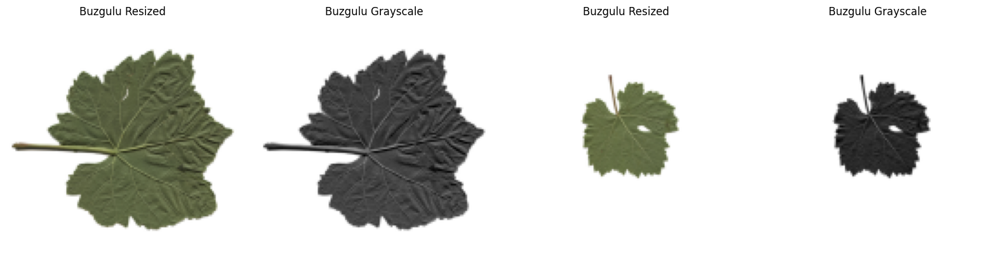

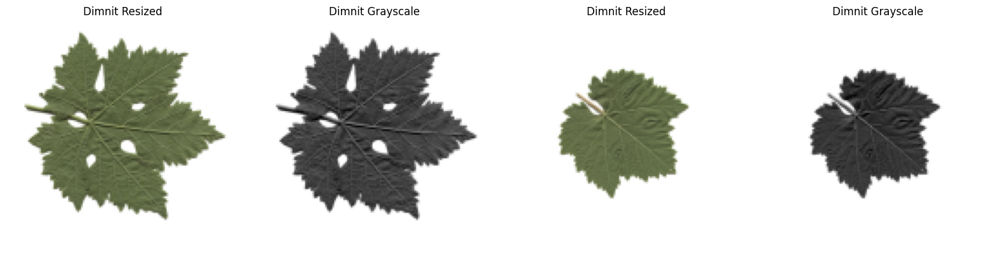

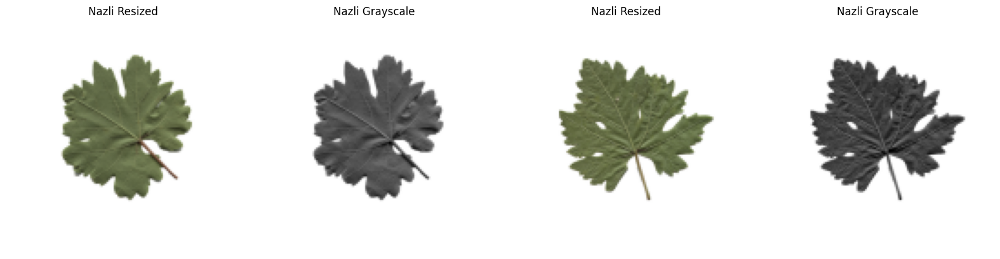

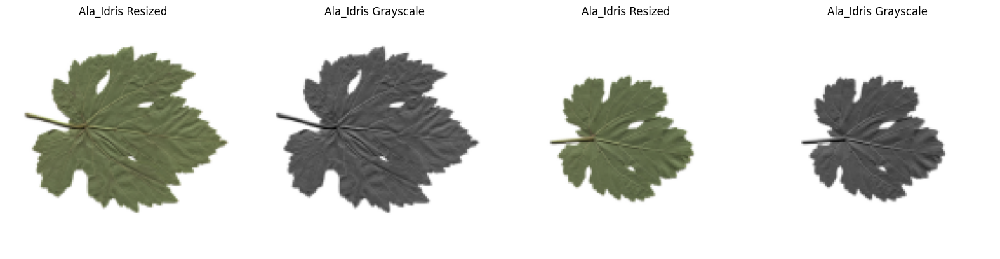

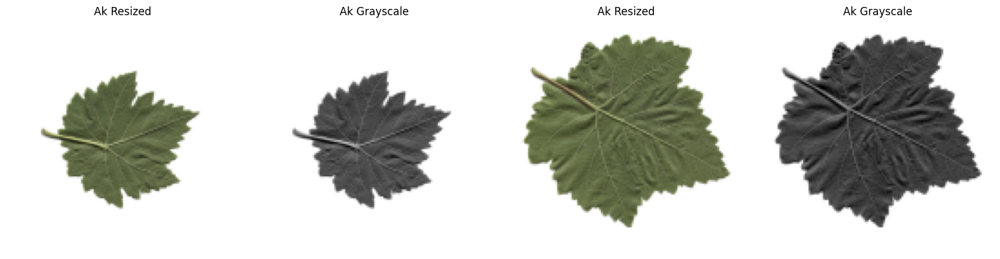

In [ ]:
grayscale = []

for class_name, image_pairs in resized.items():
    plt.figure(figsize=(16, 4))

    for before_img, resized_img in image_pairs:
        gray_img = cv2.cvtColor(resized_img, cv2.COLOR_BGR2GRAY)
        grayscale.append((gray_img, class_name))

    for i, (before_img, resized_img) in enumerate(image_pairs[:2]):
        gray_img = cv2.cvtColor(resized_img, cv2.COLOR_BGR2GRAY)

        plt.subplot(1, 4, 2*i + 1)
        plt.imshow(cv2.cvtColor(resized_img, cv2.COLOR_BGR2RGB))
        plt.title(f"{class_name} Resized")
        plt.axis('off')

        plt.subplot(1, 4, 2*i + 2)
        plt.imshow(gray_img, cmap='gray')
        plt.title(f"{class_name} Grayscale")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

### c. Enhancement Menggunakan CLAHE

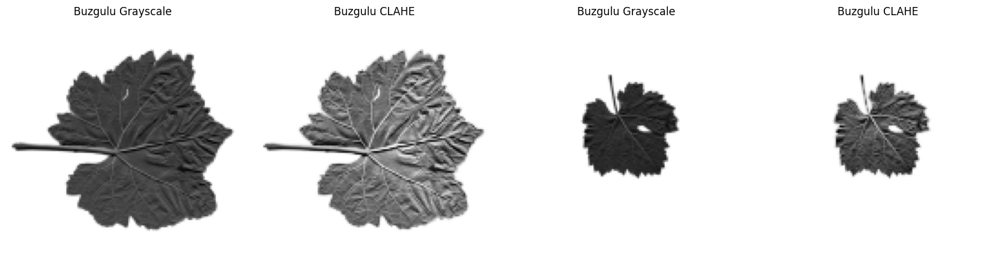

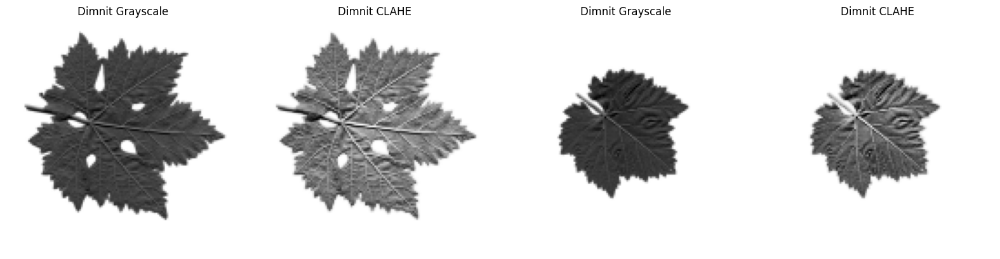

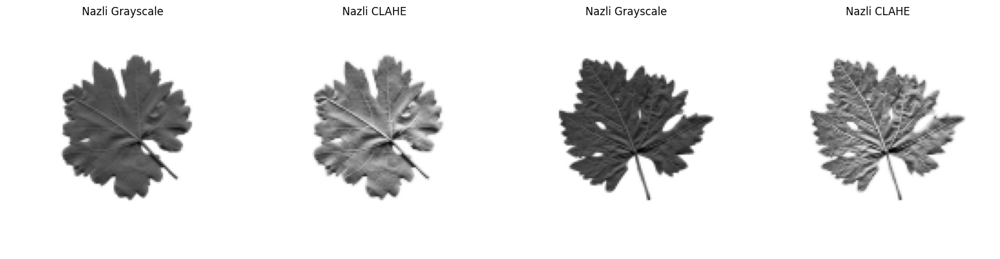

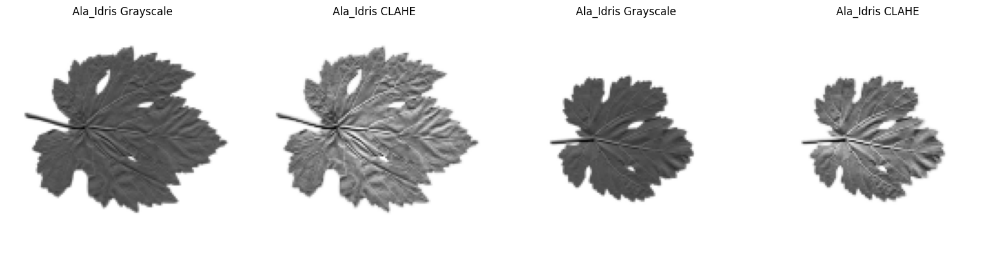

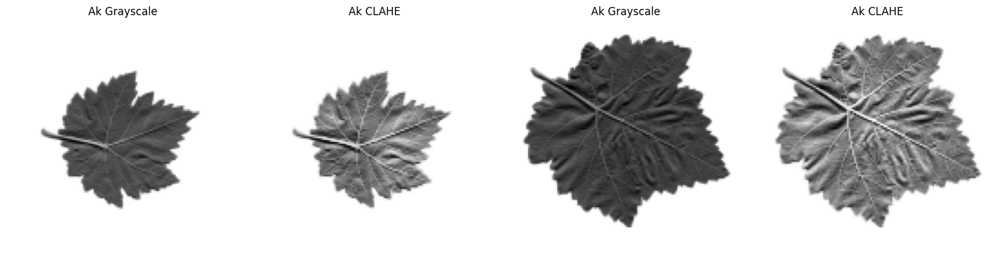

In [ ]:
from collections import defaultdict

clahe_processor = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
clahe = []

grayscale_by_class = defaultdict(list)
for gray_img, class_name in grayscale:
    grayscale_by_class[class_name].append(gray_img)

for class_name, gray_imgs in grayscale_by_class.items():
    plt.figure(figsize=(16, 4))

    for gray_img in gray_imgs:
        clahe_img = clahe_processor.apply(gray_img)
        clahe.append((clahe_img, class_name))

    for i in range(min(2, len(gray_imgs))):
        gray_img = gray_imgs[i]
        clahe_img = clahe_processor.apply(gray_img)

        plt.subplot(1, 4, 2*i + 1)
        plt.imshow(gray_img, cmap='gray')
        plt.title(f"{class_name} Grayscale")
        plt.axis('off')

        plt.subplot(1, 4, 2*i + 2)
        plt.imshow(clahe_img, cmap='gray')
        plt.title(f"{class_name} CLAHE")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

### d. Ekstraksi LBP

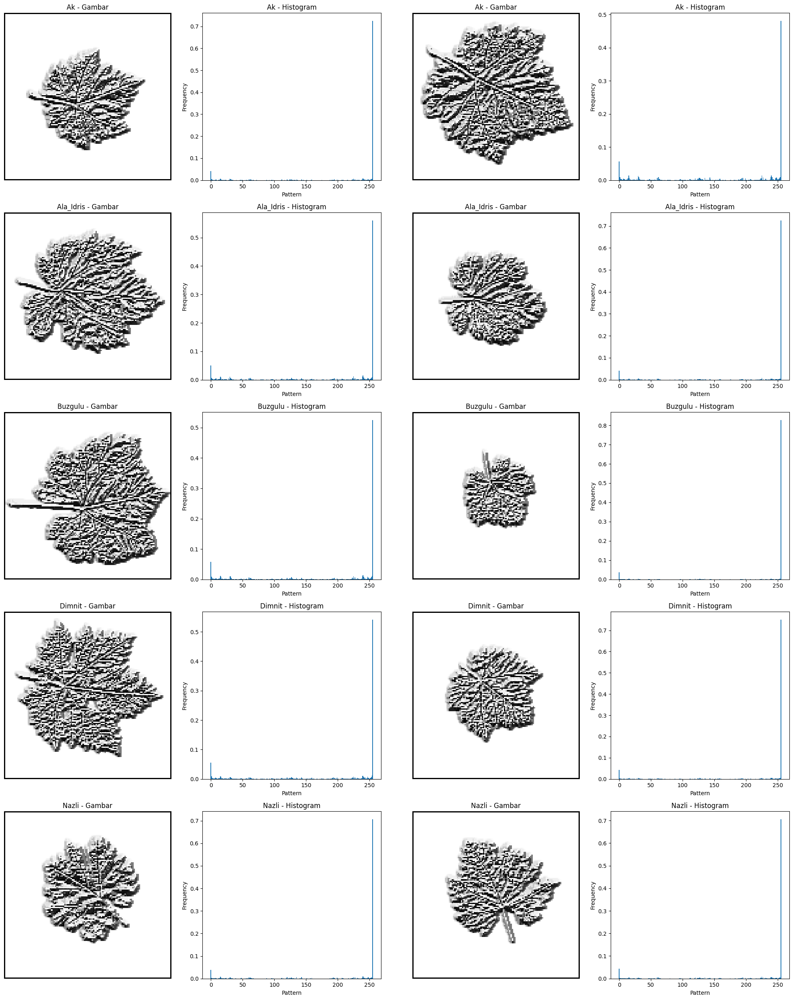

In [ ]:
import numpy as np

def manual_lbp(image):
    lbp_image = np.zeros_like(image, dtype=np.uint8)
    rows, cols = image.shape
    for i in range(1, rows - 1):
        for j in range(1, cols - 1):
            center = image[i, j]
            neighbors = [
                image[i - 1, j - 1], image[i - 1, j], image[i - 1, j + 1],
                image[i, j + 1], image[i + 1, j + 1], image[i + 1, j],
                image[i + 1, j - 1], image[i, j - 1]
            ]
            binary_string = ''.join(['1' if neighbor >= center else '0' for neighbor in neighbors])
            lbp_value = int(binary_string, 2)
            lbp_image[i, j] = lbp_value
    return lbp_image

clahe_by_class = defaultdict(list)
for clahe_img, class_name in clahe:
    clahe_by_class[class_name].append(clahe_img)

classes = sorted(clahe_by_class.keys())

lbp_results = []

for class_name in classes:
    clahe_imgs = clahe_by_class[class_name]
    for i, clahe_img in enumerate(clahe_imgs):
        lbp_img = manual_lbp(clahe_img)
        lbp_results.append((lbp_img, class_name, i))

plt.figure(figsize=(20, len(classes) * 5))
plot_index = 1

for class_name in classes:
    filtered = [item for item in lbp_results if item[1] == class_name][:2]
    for lbp_img, _, i in filtered:
        hist, _ = np.histogram(lbp_img.ravel(), bins=256, range=(0, 256))
        hist = hist.astype('float')
        hist /= (hist.sum() + 1e-7)

        plt.subplot(len(classes), 4, plot_index)
        plt.imshow(lbp_img, cmap='gray', interpolation='nearest')
        plt.title(f"{class_name} - Gambar", fontsize=12)
        plt.axis('off')
        plot_index += 1

        plt.subplot(len(classes), 4, plot_index)
        plt.bar(range(len(hist)), hist, width=1.0)
        plt.title(f"{class_name} - Histogram", fontsize=12)
        plt.xlabel("Pattern", fontsize=10)
        plt.ylabel("Frequency", fontsize=10)
        plot_index += 1

plt.tight_layout()
plt.show()

### e. Ekstraksi GLCM

In [ ]:
import pandas as pd

def quantize_image(img, levels=8):
    return (img // (256 // levels)).astype(np.uint8)

def compute_glcm_manual_multi_direction(img, levels=8, distances=[1], angles=[0, np.pi/4, np.pi/2, 3*np.pi/4]):
    glcm_total = np.zeros((levels, levels), dtype=np.uint32)
    rows, cols = img.shape

    def angle_to_offset(angle):
        dx = int(round(np.cos(angle)))
        dy = int(round(np.sin(angle)))
        return dx, dy

    for dist in distances:
        for angle in angles:
            dx, dy = angle_to_offset(angle)
            dx *= dist
            dy *= dist

            row_max = rows - abs(dy)
            col_max = cols - abs(dx)

            for i in range(row_max):
                for j in range(col_max):
                    current = img[i, j]
                    neighbor = img[i + dy, j + dx]
                    glcm_total[current, neighbor] += 1

    return glcm_total

def glcm_features(glcm):
    total = glcm.sum()
    norm_glcm = glcm / total if total != 0 else glcm

    contrast = 0
    homogeneity = 0
    energy = 0
    entropy = 0

    for i in range(norm_glcm.shape[0]):
        for j in range(norm_glcm.shape[1]):
            p = norm_glcm[i, j]
            contrast += (i - j)**2 * p
            homogeneity += p / (1 + abs(i - j))
            energy += p**2
            if p > 0:
                entropy -= p * np.log2(p)

    return contrast, homogeneity, energy, entropy

class_to_images = defaultdict(list)
for img, label in clahe:
    class_to_images[label].append(img)

feature_rows = []
glcm = []

for class_name, images in class_to_images.items():
    for idx, img in enumerate(images):
        quantized = quantize_image(img)
        glcm_matrix = compute_glcm_manual_multi_direction(quantized)
        contrast, homogeneity, energy, entropy = glcm_features(glcm_matrix)

        feature_rows.append({
            "Label": class_name,
            "Image_Index": idx + 1,
            "Contrast": contrast,
            "Homogeneity": homogeneity,
            "Energy": energy,
            "Entropy": entropy
        })

        glcm.append((glcm_matrix, class_name))

df_features = pd.DataFrame(feature_rows)

df_display = df_features.groupby("Label").head(3).reset_index(drop=True)
df_display

,Label,Image_Index,Contrast,Homogeneity,Energy,Entropy
0,Buzgulu,1,0.882353,0.847895,0.339844,2.873982
1,Buzgulu,2,0.179558,0.962427,0.764109,1.002249
2,Buzgulu,3,0.488590,0.901906,0.516688,2.020800
3,Dimnit,1,0.726509,0.860579,0.371656,2.635914
4,Dimnit,2,0.271792,0.936504,0.640551,1.489330
5,Dimnit,3,0.314961,0.931965,0.630520,1.562982
6,Nazli,1,0.336112,0.930069,0.588183,1.765286
7,Nazli,2,0.428964,0.913499,0.588478,1.807959
8,Nazli,3,0.404385,0.921122,0.578750,1.725672
9,Ala_Idris,1,0.602069,0.875249,0.392968,2.488262


### f. Penggambungan Fitur

In [ ]:
def lbp_histogram(lbp_img):
    hist, _ = np.histogram(lbp_img.ravel(), bins=256, range=(0, 256))
    hist = hist.astype('float')
    hist /= (hist.sum() + 1e-7)
    return hist

lbpglcm_features = []
lbpglcm_labels = []

for lbp_img, label, idx in lbp_results:
    row = df_features[(df_features['Label'] == label) & (df_features['Image_Index'] == idx + 1)]
    if row.empty:
        continue

    glcm_feat = row[['Contrast', 'Homogeneity', 'Energy', 'Entropy']].values.flatten()

    lbp_hist = lbp_histogram(lbp_img)

    combined_vector = np.concatenate([lbp_hist, glcm_feat])

    lbpglcm_features.append(combined_vector)
    lbpglcm_labels.append(label)

combined_features = np.array(lbpglcm_features)
combined_labels = np.array(lbpglcm_labels)

print(f"Jumlah sampel: {combined_features.shape[0]}, Dimensi fitur gabungan: {combined_features.shape[1]}")

Jumlah sampel: 500, Dimensi fitur gabungan: 260


## **Split Data**

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    combined_features, combined_labels, test_size=0.2, random_state=42, stratify=combined_labels
)

print(f"Training samples: {X_train.shape[0]}, Testing samples: {X_test.shape[0]}")

Training samples: 400, Testing samples: 100


## **Implementasi Model SVM**

In [ ]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

svm_model = SVC(kernel='linear', random_state=42)
svm_model.fit(X_train, y_train)

y_pred = svm_model.predict(X_test)

acc = accuracy_score(y_test, y_pred)
print(f"Accuracy: {acc:.4f}\n")
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Accuracy: 0.3700

Confusion Matrix:
[[ 6  7  0  7  0]
 [ 3 17  0  0  0]
 [ 1  4  4  9  2]
 [ 2  7  1 10  0]
 [ 0  7  2 11  0]]

Classification Report:
              precision    recall  f1-score   support

          Ak       0.50      0.30      0.38        20
   Ala_Idris       0.40      0.85      0.55        20
     Buzgulu       0.57      0.20      0.30        20
      Dimnit       0.27      0.50      0.35        20
       Nazli       0.00      0.00      0.00        20

    accuracy                           0.37       100
   macro avg       0.35      0.37      0.31       100
weighted avg       0.35      0.37      0.31       100



Accuracy: 0.1800

Confusion Matrix:
[[ 8 11  1  0  0]
 [10  9  1  0  0]
 [ 9  8  1  1  1]
 [11  9  0  0  0]
 [ 5 11  4  0  0]]

Classification Report:
              precision    recall  f1-score   support

          Ak       0.19      0.40      0.25        20
   Ala_Idris       0.19      0.45      0.26        20
     Buzgulu       0.14      0.05      0.07        20
      Dimnit       0.00      0.00      0.00        20
       Nazli       0.00      0.00      0.00        20

    accuracy                           0.18       100
   macro avg       0.10      0.18      0.12       100
weighted avg       0.10      0.18      0.12       100



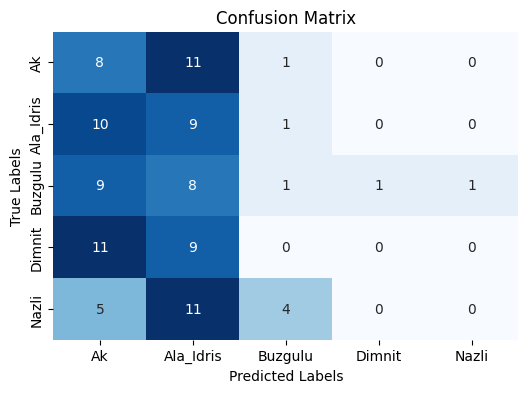

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Training model
svm_model = SVC(kernel='linear', random_state=42)
svm_model.fit(X_train, y_train)

# Prediksi
y_pred = svm_model.predict(X_test)

# Evaluasi
acc = accuracy_score(y_test, y_pred)
print(f"Accuracy: {acc:.4f}\n")
print("Confusion Matrix:")
cm = confusion_matrix(y_test, y_pred)
print(cm)

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Visualisasi Confusion Matrix
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=svm_model.classes_, yticklabels=svm_model.classes_)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

# Visualisasi Decision Boundary (untuk 2D data saja)
if X_train.shape[1] == 2:
    import numpy as np

    def plot_decision_boundary(model, X, y):
        h = .02
        x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
        y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
        xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                             np.arange(y_min, y_max, h))

        Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
        Z = Z.reshape(xx.shape)

        plt.figure(figsize=(8, 6))
        plt.contourf(xx, yy, Z, alpha=0.3)
        scatter = plt.scatter(X[:, 0], X[:, 1], c=y, s=30, cmap=plt.cm.coolwarm, edgecolors='k')
        plt.xlabel("Feature 1")
        plt.ylabel("Feature 2")
        plt.title("SVM Decision Boundary")
        plt.legend(*scatter.legend_elements(), title="Classes")
        plt.show()

    plot_decision_boundary(svm_model, X_train.values if hasattr(X_train, 'values') else X_train, y_train)
